# **I. Dataset Description**

Les cartes de pointage de crédit sont une méthode courante de contrôle des risques dans le secteur financier. Il utilise les informations personnelles et les données soumises par les demandeurs de carte de crédit pour prédire la probabilité de défauts de paiement futurs et d'emprunts par carte de crédit. La banque peut décider de délivrer ou non une carte de crédit au demandeur. Les pointages de crédit peuvent objectivement quantifier l'ampleur du risque.

# **II. Data preparation**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

### **II.1 Data Importation**

### **Data 1**

In [2]:
!pip install plotly --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 31.5 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.13.1
    Uninstalling plotly-5.13.1:
      Successfully uninstalled plotly-5.13.1


In [ ]:
from google.colab import files
UK = files.upload()

In [3]:
df1 = pd.read_csv("application_record.csv")

In [4]:
df1.isnull().sum()

ID                          0
CODE_GENDER                 0
FLAG_OWN_CAR                0
FLAG_OWN_REALTY             0
CNT_CHILDREN                0
AMT_INCOME_TOTAL            0
NAME_INCOME_TYPE            0
NAME_EDUCATION_TYPE         0
NAME_FAMILY_STATUS          0
NAME_HOUSING_TYPE           0
DAYS_BIRTH                  0
DAYS_EMPLOYED               0
FLAG_MOBIL                  0
FLAG_WORK_PHONE             0
FLAG_PHONE                  0
FLAG_EMAIL                  0
OCCUPATION_TYPE        134203
CNT_FAM_MEMBERS             0
dtype: int64

In [5]:
application_df = df1.copy()
application_df

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438552,6840104,M,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.0
438553,6840222,F,N,N,0,103500.0,Working,Secondary / secondary special,Single / not married,House / apartment,-15939,-3007,1,0,0,0,Laborers,1.0
438554,6841878,F,N,N,0,54000.0,Commercial associate,Higher education,Single / not married,With parents,-8169,-372,1,1,0,0,Sales staff,1.0
438555,6842765,F,N,Y,0,72000.0,Pensioner,Secondary / secondary special,Married,House / apartment,-21673,365243,1,0,0,0,NaN,2.0


### **Data 2**

In [ ]:
UK1 = files.upload()

In [6]:
credit_status = pd.read_csv("credit_record.csv")

### **II.2 Data 2 Cleaning**

In [7]:
# replace X, and C by 0
credit_status.STATUS.replace('X', 0, inplace=True)
credit_status.STATUS.replace('C', 0, inplace=True)
credit_status.STATUS = credit_status.STATUS.astype('int')

# record the worst credit record.
credit_record = credit_status.groupby('ID').STATUS.max()
credit_record.head(10)

ID
5001711    0
5001712    0
5001713    0
5001714    0
5001715    0
5001717    0
5001718    1
5001719    0
5001720    1
5001723    0
Name: STATUS, dtype: int64

## **Combine two Data**

### **Data 3**

In [8]:
# combine two table
df3 = pd.merge(application_df, credit_record, how='inner', on=['ID'])
df3

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,STATUS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,1
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,1
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36452,5149828,M,Y,Y,0,315000.0,Working,Secondary / secondary special,Married,House / apartment,-17348,-2420,1,0,0,0,Managers,2.0,5
36453,5149834,F,N,Y,0,157500.0,Commercial associate,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.0,5
36454,5149838,F,N,Y,0,157500.0,Pensioner,Higher education,Married,House / apartment,-12387,-1325,1,0,1,1,Medicine staff,2.0,5
36455,5150049,F,N,Y,0,283500.0,Working,Secondary / secondary special,Married,House / apartment,-17958,-655,1,0,0,0,Sales staff,2.0,2


In [9]:
df3.STATUS = df3.STATUS.apply(lambda x: 1 if x >= 2 else 0)
df3.head(5)

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,STATUS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,0


In [10]:
df3 = df3.sort_values('AMT_INCOME_TOTAL')
df3 = df3.reset_index(drop=True)
df3.ID=df3.index
df3.columns = ('User_id',
              'Gender',
              'Car',
              'Realty',
              'children_count',
              'income_amount',
              'income_type',
              'education_type',
              'Family_status',
              'Housing_type',
              'Days_birth',
              'Days_employed',
              'Mobile',
              'Work_phone',
              'Phone',
              'Email',
              'Occupation_type',
              'Count_family_members',
              'Reject',
              )
df3.head()

,User_id,Gender,Car,Realty,children_count,income_amount,income_type,education_type,Family_status,Housing_type,Days_birth,Days_employed,Mobile,Work_phone,Phone,Email,Occupation_type,Count_family_members,Reject
0,0,F,N,N,0,27000.0,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,1,0,0,Managers,2.0,0
1,1,F,N,N,0,27000.0,Working,Higher education,Civil marriage,House / apartment,-14869,-5067,1,1,0,0,Managers,2.0,0
2,2,F,N,Y,0,27000.0,Working,Secondary / secondary special,Married,House / apartment,-19128,-1323,1,1,0,0,Security staff,2.0,0
3,3,F,Y,Y,0,29250.0,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,1,0,0,0,NaN,2.0,0
4,4,F,Y,Y,0,29250.0,Pensioner,Secondary / secondary special,Married,House / apartment,-20086,365243,1,0,0,0,NaN,2.0,0


### **II. 3 Data Exploration**

### **Features Selection with Correlation**

In [11]:
df3.corr()

,User_id,children_count,income_amount,Days_birth,Days_employed,Mobile,Work_phone,Phone,Email,Count_family_members,Reject
User_id,1.000000,0.031861,0.850407,0.104237,-0.200675,NaN,-0.049179,-0.004430,0.080515,0.018270,-0.000306
children_count,0.031861,1.000000,0.033691,0.339357,-0.229379,NaN,0.048091,-0.016291,0.015960,0.889114,-0.000308
income_amount,0.850407,0.033691,1.000000,0.067908,-0.168611,NaN,-0.037746,0.017245,0.086681,0.023750,-0.001057
Days_birth,0.104237,0.339357,0.067908,1.000000,-0.616213,NaN,0.179054,-0.028659,0.105625,0.304020,0.001478
Days_employed,-0.200675,-0.229379,-0.168611,-0.616213,1.000000,NaN,-0.242869,-0.007233,-0.085648,-0.221241,0.005664
Mobile,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Work_phone,-0.049179,0.048091,-0.037746,0.179054,-0.242869,NaN,1.000000,0.311644,-0.034838,0.064527,0.005640
Phone,-0.004430,-0.016291,0.017245,-0.028659,-0.007233,NaN,0.311644,1.000000,0.010455,-0.004221,0.001585
Email,0.080515,0.015960,0.086681,0.105625,-0.085648,NaN,-0.034838,0.010455,1.000000,0.014619,-0.002434
Count_family_members,0.018270,0.889114,0.023750,0.304020,-0.221241,NaN,0.064527,-0.004221,0.014619,1.000000,-0.005660


In [12]:
correlation_df = df3.copy()
correlation_df = correlation_df.drop('Mobile', axis=1)
correlation_df = correlation_df.drop('User_id', axis=1)

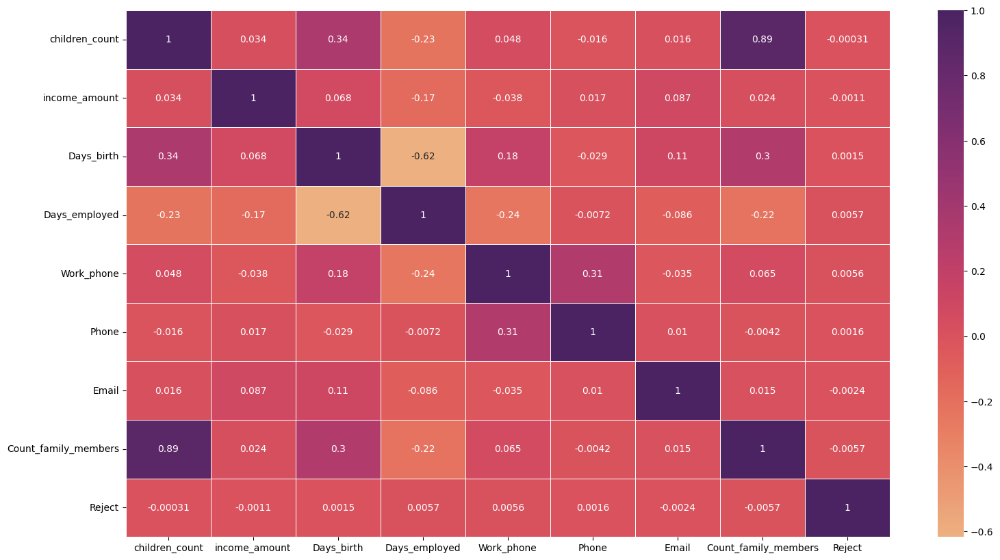

In [13]:
fig, ax = plt.subplots(figsize=(18,10))
# seaborn heatmap
sns.heatmap(correlation_df.corr(), annot=True, cmap='flare', linewidths=.5)
# plot the heatmap
plt.show()

### **Interpretation**



*   Il n'y a aucune caractéristique qui est corrélée avec la caractéristique cible.
*   Le nombre de membres de la famille(count_family_members) est fortement corrélé avec le nombre d'enfants(children_count).


*   L'âge(Days_birth) a une certaine corrélation positive avec le nombre de membres de la famille(count_family_members) et le nombre d'enfants(children_count). Plus une personne est âgée, plus il est probable qu'elle ait une famille plus nombreuse.

*   Une autre corrélation positive est d'avoir un téléphone(Phone) et d'avoir un téléphone de travail(Work-phone).


*   La dernière corrélation positive est entre l'âge(Days_birth) et le téléphone de travail(Work-phone). Plus une personne est jeune, moins il est probable qu'elle ait un 
téléphone de travail.

*   Nous avons également une corrélation forte négative entre la durée d'emploi(Days_employed) et l'âge(Days_birth).


*   Donc les variables à retenir (qui sont fortement corrélées) sont :

*   **Le nombre de membres de la famille(count_family_members)**
*   **le nombre d'enfants(children_count)**
*   **la durée d'emploi(Days_employed)**
*   **l'âge(Days_birth)**








### **hypothesis testing in feature selection**

In [14]:
import pandas as pd
from scipy.stats import ttest_ind

# Remove any missing or duplicate values
df3 = df3.dropna().drop_duplicates()

# Identify the target variable and features
target = 'Reject'
features = [
              'children_count',
              'income_amount',
              'Days_birth',
              'Days_employed',
              'Mobile',
              'Work_phone',
              'Phone',
              'Email',
              'Count_family_members']

# Split the dataset into approved and denied applicants
approved = df3[df3[target] == 0]
denied = df3[df3[target] == 1]

# Conduct a t-test for each feature to compare the means between approved and denied applicants
for feature in features:
    # Calculate the t-statistic and p-value
    t_stat, p_val = ttest_ind(approved[feature], denied[feature])
    print('Feature:', feature)
    print('T-statistic:', t_stat)
    print('P-value:', p_val)
    # Compare the p-value to the significance level (alpha = 0.05)
    if p_val < 0.05:
        print('Différence significative constatée entre les candidats approuvés et refusés pour la fonctionnalité', feature)
    else:
        print('Aucune différence significative n a été trouvée entre les candidats approuvés et refusés pour la fonctionnalité', feature)


Feature: children_count
T-statistic: 0.1374021739791545
P-value: 0.8907140134565079
Aucune différence significative n a été trouvée entre les candidats approuvés et refusés pour la fonctionnalité children_count
Feature: income_amount
T-statistic: -1.0352215170550445
P-value: 0.3005754330514585
Aucune différence significative n a été trouvée entre les candidats approuvés et refusés pour la fonctionnalité income_amount
Feature: Days_birth
T-statistic: -1.2266875912366528
P-value: 0.21995152530398904
Aucune différence significative n a été trouvée entre les candidats approuvés et refusés pour la fonctionnalité Days_birth
Feature: Days_employed
T-statistic: -5.211496317053571
P-value: 1.8880264367668179e-07
Différence significative constatée entre les candidats approuvés et refusés pour la fonctionnalité Days_employed
Feature: Mobile
T-statistic: nan
P-value: nan
Aucune différence significative n a été trouvée entre les candidats approuvés et refusés pour la fonctionnalité Mobile
Feature: 

<ipython-input-14-01dddb5eae21>:27: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  t_stat, p_val = ttest_ind(approved[feature], denied[feature])


### **Features Selection with PCA**

In [15]:
#Standarization de la Data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(df3[['children_count','Days_birth','Days_employed','Count_family_members']])

In [16]:
#Trouver le nombre de facteurs à retenir
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X)

variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(variance_ratio)

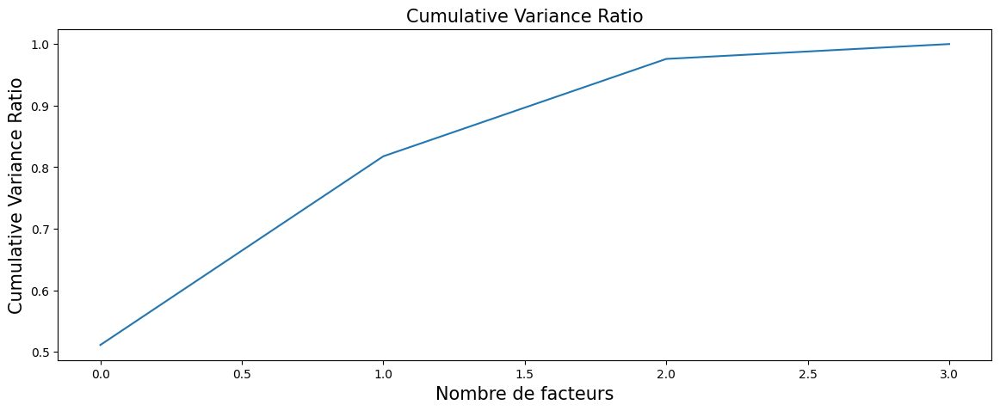

In [84]:
#Visualisation de la courbe cumulative de la variance
fig,ax = plt.subplots(figsize=(14,5))
plt.plot(cumulative_variance_ratio)
plt.title('Cumulative Variance Ratio',fontsize=15)
plt.xlabel("Nombre de facteurs",fontsize=15)
plt.ylabel('Cumulative Variance Ratio',fontsize=15)
plt.show()

**Interprétation**

D'après le graphe, on a un point d'inflexion lorsque le nombre de facteurs est égale à 2 et on remarque que c'est le point auquel la courbe s'aplatit dans le tracé du rapport de variance cumulé. D'où le nombre de facteurs à retenir est 2 expliquant un pourcentage à peu près de 96% de la variance totale.

In [18]:
#Appliquer le pca sur la dataset avec un nombre de facteurs égale à 2
n_components = 2

final_pc = PCA(n_components).fit(X)

pca_df = final_pc.fit_transform(X)

## **III. Data Visualization**

### **Treemap charts**

In [19]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

fig = px.treemap(df1, path=[px.Constant("ID"), 'CODE_GENDER','NAME_EDUCATION_TYPE','NAME_INCOME_TYPE'], values='AMT_INCOME_TOTAL')
fig.update_traces(root_color="lightblue")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

### **Interprétation:**

A partir de ce graphe on conlut que les femme ont un revenue plus grand que les hommes en spécifiant que : -Dand les femmes on voit qu'ona dans la catégorie de "Secondary" dans le niveau de l'éducation que le nombre qui sont en travail "Working" est plus grand que le nombre qui ont un niveau d'éducation lycée "Higher education", Tandis que pour les hommes ona le nombre qui ont un niveau d'éducation secandaire "Secondary" et qui sont en travail est plus grand que , qui ont un niveau d'éducation lycée. 

### **Pie chart**

In [20]:
import plotly.graph_objects as go

labels = df1['CODE_GENDER']
values = df1['DAYS_EMPLOYED']
colors = ['gold', 'mediumturquoise', 'darkorange', 'lightgreen']

fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=15,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.show()

### **Interprétation:**

A partir de cette pie chart on concut que la majorité sont les femmes qui ont un debut d'emploi "DAYS_EMPLOYED" que les hommes c'est à dir les femmes qui sont plus recruter que les hommes d'aprés cette dataset.

### **Horizontal Bar Charts**

In [21]:
import plotly.express as px
fig = px.histogram(df1, y='NAME_FAMILY_STATUS', x='AMT_INCOME_TOTAL', color='CODE_GENDER', title = 'Nombre de revenue à partir de État civil')
fig.show()

### **Interprétation:** 

A partir de ce graphe on conclut que les marriés "Married" ont un revenue plus grand que les autres états civil en spécifiant que les femmes marriées ont un revenue plus grand que les hommes marriés , Tandis qu'on voit que les veuves "Widow" ont un revenue minimal que les autres en spécifiant que les hommes veuves ont un revenue trés moins que les hommes.

### **Boxplots**

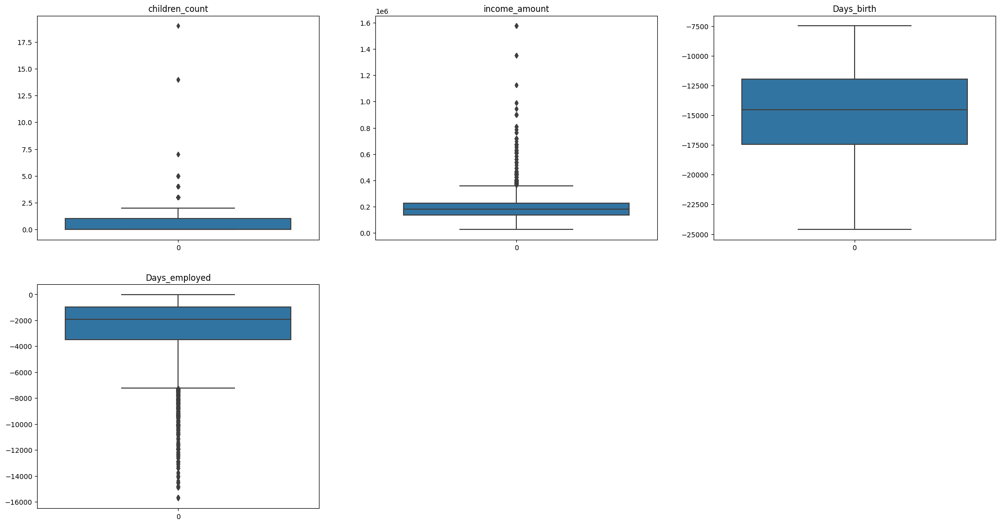

In [22]:
plt.figure(figsize=(25,20))
columns = ['children_count',
              'income_amount',
              'Days_birth',
              'Days_employed']
for i in range(len(columns)):
    plt.subplot(3,3,i+1)
    sns.boxplot(df3[columns[i]])
    plt.title(columns[i])
    

### **Vertical Bar Charts for Data 3**

### **Bar 1**

<ipython-input-68-435246e905c4>:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

<ipython-input-68-435246e905c4>:10: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



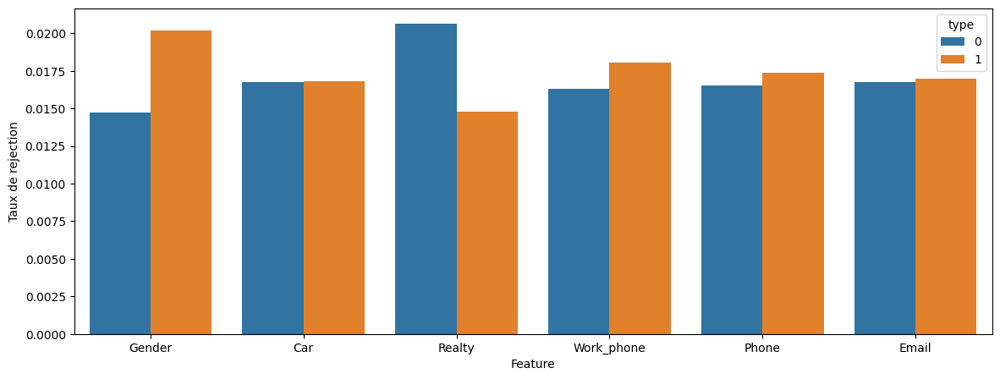

,Feature,type,Taux de rejection,count,Nombre de rejets
0,Gender,0,0.014715,15630,230
1,Gender,1,0.020202,9504,192
2,Car,0,0.016760,14618,245
3,Car,1,0.016831,10516,177
4,Realty,0,0.020639,8673,179
5,Realty,1,0.014762,16461,243
6,Work_phone,0,0.016327,18252,298
7,Work_phone,1,0.018018,6882,124
8,Phone,0,0.016540,17775,294
9,Phone,1,0.017394,7359,128


In [68]:
binary_features = ['Gender', 'Car', 'Realty', 'Work_phone', 'Phone', 'Email']
binary_df = df3[binary_features+['Reject']].replace('M', 1).replace('F', 0).replace('Y', 1).replace('N', 0)
dict_list = []
for feature in binary_features:
    for one_type in [0, 1]:
        dict_list.append({'Feature': feature,
                          'type': one_type,
                          'Taux de rejection': len(binary_df[binary_df[feature]==one_type][binary_df.Reject==1])/len(binary_df[binary_df[feature]==one_type]),
                          'count': len(binary_df[binary_df[feature]==one_type]),
                          'Nombre de rejets': len(binary_df[binary_df[feature]==one_type][binary_df.Reject==1])
                         })
fig,ax = plt.subplots(figsize=(14,5))
group_binary = pd.DataFrame.from_dict(dict_list)
sns.barplot(x="Feature", y="Taux de rejection", hue="type", data=group_binary)
plt.show()
group_binary

### **Interpretation**

Dans ce bar chart, on remarque le taux de rejection est plus grand dans la catégorie des femmes que celles des hommes, et on voit aussi que le taux d'etre rejeté en ayant une voiture est plus petit.Par contre on voit qu'avoir une maison indique un taux de rejection qui est plus grand . Et pour le reste, la probabilité de rejection est quasi-équitable (au niveau de l'email et le téléphone)

### **Bar 2**

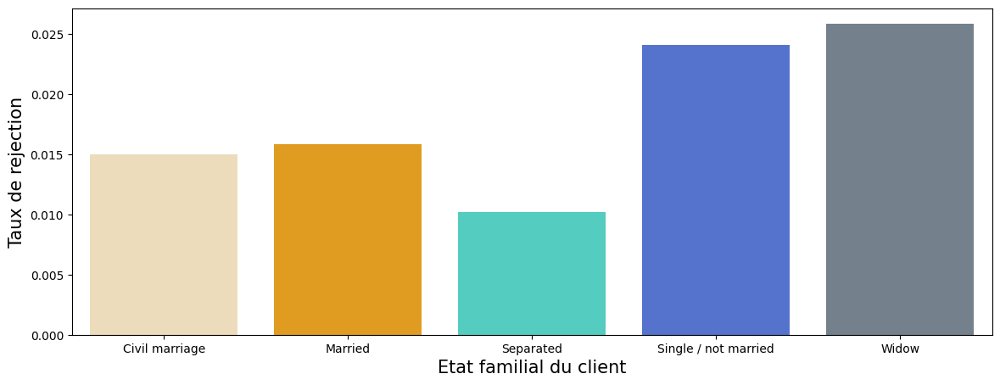

In [69]:
fig,ax = plt.subplots(figsize=(14,5))
colors = ['wheat','orange','turquoise','royalblue','slategrey']
gp_total=df3.groupby(by=['Family_status']).size().reset_index(name='times')
gp_reject = df3[df3.Reject==1].groupby(by=['Family_status']).size().reset_index(name='reject_times')
gp_reject_rate = pd.merge(gp_total, gp_reject, how='outer', on=['Family_status']).fillna(0)
gp_reject_rate['reject_rate'] = gp_reject_rate.reject_times / gp_reject_rate.times
sns.barplot(x="Family_status", y="reject_rate", data=gp_reject_rate,palette=colors)
plt.ylabel('Taux de rejection',fontsize=15)
plt.xlabel('Etat familial du client',fontsize=15)
plt.show()

### **Interpretation**

Dans ce bar chart, on remarque que les catégories sociales les plus rejetées sont veuf(widow) et single (célibataire), tandis que les autres catégories ont une probabilité d'être rejeté qui est a peu près équitable.
Ceci peut-être expliqué vu que le fait que les autres catégories d'état familial sont plus stables et moins suspectes.

### **Bar 3**

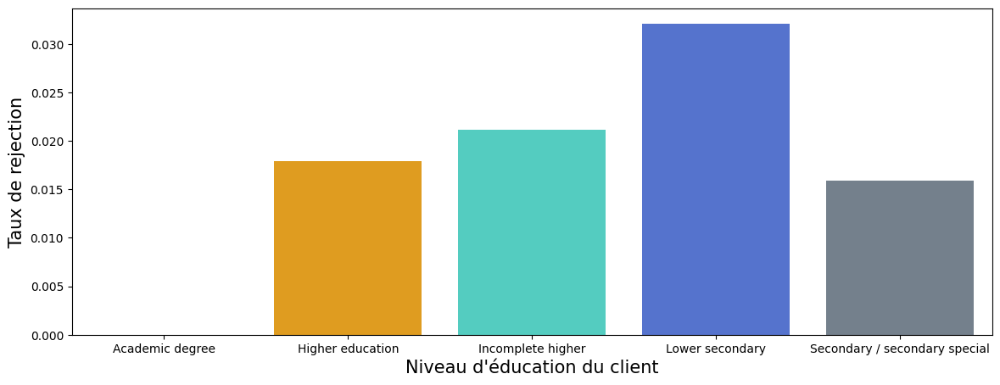

In [70]:
fig,ax = plt.subplots(figsize=(14,5))
colors = ['khaki','orange','turquoise','royalblue','slategrey']
gp_total=df3.groupby(by=['education_type']).size().reset_index(name='times')
gp_reject = df3[df3.Reject==1].groupby(by=['education_type']).size().reset_index(name='reject_times')
gp_reject_rate = pd.merge(gp_total, gp_reject, how='outer', on=['education_type']).fillna(0)
gp_reject_rate['reject_rate'] = gp_reject_rate.reject_times / gp_reject_rate.times
sns.barplot(x="education_type", y="reject_rate", data=gp_reject_rate,palette=colors)
plt.ylabel('Taux de rejection',fontsize=15)
plt.xlabel("Niveau d'éducation du client",fontsize=15)
plt.show()

### **Interpretation**

Dans ce bar chart, on remarque que les niveaux d'éducations les plus rejetées sont l'éducation supérieure incomplète (imcomplete higher) et l'enseignement secondaire inférieur (lower secondary) cela est dû au fait que les élèves appartenant a cette tranche n'ont pas encore l'expérience nécessaire et les compétences pour trouver un travail dans le marché d'emploi.

### **Line Charts for Data 3**

### **Line 1**

<ipython-input-71-ec6ec2d26d3b>:5: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




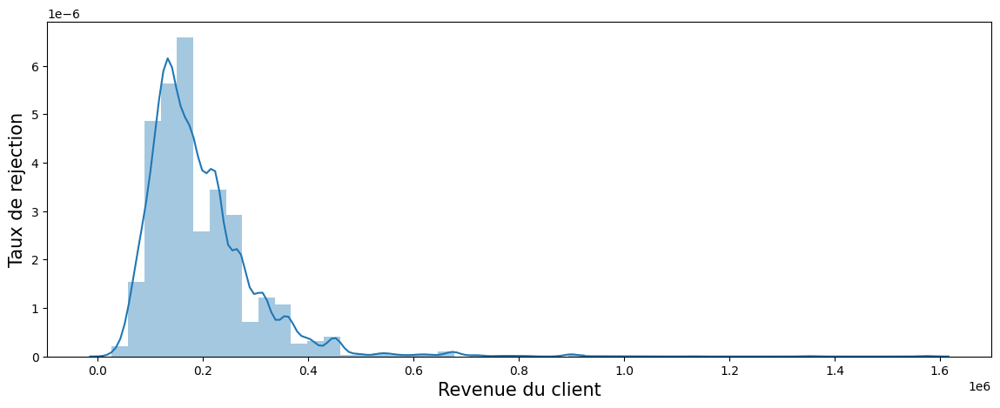

In [71]:

fig,ax = plt.subplots(figsize=(14,5))
income_plot = pd.Series(df3.income_amount,name='Revenue du client')
plt.ylabel('Taux de rejection',fontsize=15)
plt.xlabel('Revenue',fontsize=15)
sns.distplot(income_plot)
plt.show()

### **Interpretation**

D'après le graphe, on remarque que plus les clients ont un revenue qui est grand, plus ils ont un taux de rejection qui est faible. Et contrairement, les clients qui ont un revenu qui est faible sont le plus rejeté surtout ceux qui ont un salaire entre 0 et 0.3*1e6.

### **Line 2**

<ipython-input-72-99971c0ebe98>:6: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




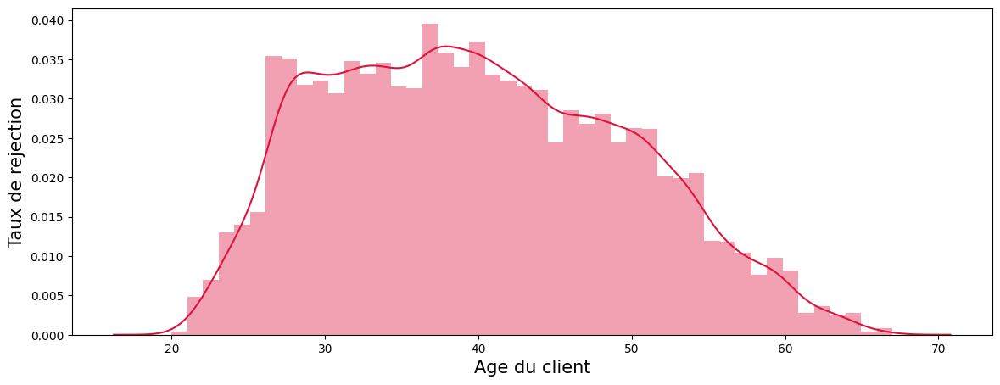

In [72]:
fig,ax = plt.subplots(figsize=(14,5))
age_series = df3.Days_birth.apply(lambda x: int(-x / 365.25))
age_plot = pd.Series(age_series, name="Age du client")
plt.ylabel('Taux de rejection',fontsize=15)
plt.xlabel('Age du client',fontsize=15)
sns.distplot(age_plot,color='crimson')
plt.show()

### **Interpretation**

D'après ce graphe, on remarque qu la catégorie d'âge la moins rejetée, c'est a dire qui a le plus de chance d'avoir un emploi est celle qui a un âge entre 20 et 26 ans , tandis que les autres catégories ont un taux de rejection qui est entre 0,02 et 0,03.Ce dernier diminue pour la tranche d'âge de 60 a 70 ans vu qu'elle inclut les retraités.

### **Line 3**

<ipython-input-73-83024338e470>:6: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




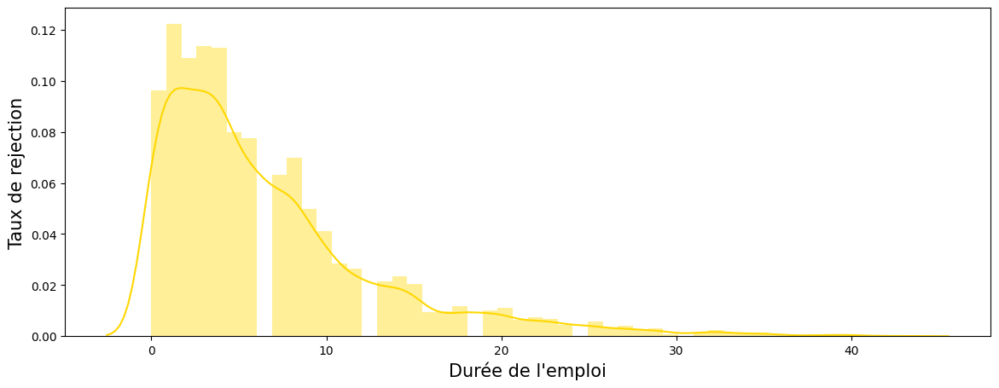

In [73]:
fig,ax = plt.subplots(figsize=(14,5))
employed_year_series = df3[df3.Days_employed<0].Days_employed.apply(lambda x: int(-x // 365.25))
employed_year_plot = pd.Series(employed_year_series, name="Durée de l'emploi")
plt.ylabel('Taux de rejection',fontsize=15)
plt.xlabel("Durée de l'emploi",fontsize=15)
sns.distplot(employed_year_plot,color='gold')
plt.show()

### **Interpretation**

D'après ce graphe, on remarque que le taux de rejection est plus grand pour les clients qui ont une durée d'emploi qui est inférieure à 10 ans, et plus cette dernière augmente plus le taux de rejection diminue.Cela est expliqué vu que le fait qu'une durée d'emploi grande traduit une expérience qui est plus riche  dans le marché de travail.

# **Machine Learning**

## **Classification**

### **I- Logistic Regression Model**

In [29]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix

# Split the data into features and target variable
X = df3[['children_count',
              'Days_birth',
              'Days_employed',
              'Count_family_members']]
y = df3['Reject'].values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Feature scaling
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Create and fit the logistic regression model
log_reg = LogisticRegression(random_state=0)
log_reg.fit(X_train, y_train)

# Predict the test set results
y_pred = log_reg.predict(X_test)

In [30]:
# Evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
# calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# calculate classification report
cr = classification_report(y_test, y_pred)

# print the results
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm)
print("\nClassification Report:\n", cr)

Accuracy: 0.9801074199323653
Confusion Matrix:
 [[4927    0]
 [ 100    0]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      4927
           1       0.00      0.00      0.00       100

    accuracy                           0.98      5027
   macro avg       0.49      0.50      0.49      5027
weighted avg       0.96      0.98      0.97      5027



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



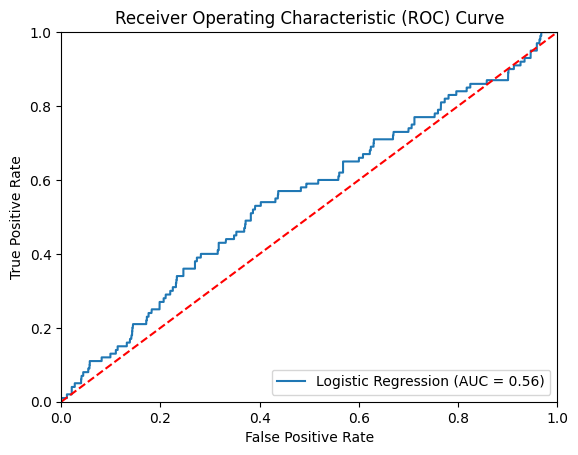

In [31]:
from sklearn.metrics import roc_curve, roc_auc_score

# Compute ROC curve and ROC area for the logistic regression model
y_pred_prob = log_reg.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = roc_auc_score(y_test, y_pred_prob)

# Plot ROC curve
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, label='Logistic Regression (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


**Interprétation**

L'Accuracy est de 0,9801, ce qui signifie que le modèle a correctement prédit la catégorie de 98,01 % des échantillons.

La matrice de confusion indique que le modèle a correctement prédit les 4927 échantillons de la classe 0 (accepté) et a incorrectement prédit aucun échantillon de cette classe. Cependant, le modèle n'a pas correctement prédit les 100 échantillons de la classe 1 (rejeté), et n'a prédit aucun échantillon de cette classe correctement.

Le rapport de classification montre une précision de 0,98 pour la classe 0 (accepté), ce qui signifie que le modèle a correctement prédit 98 % des échantillons qui ont été classés comme accepté. Cependant, pour la classe 1 (rejeté), la précision est de 0,00, ce qui indique que le modèle n'a prédit aucun échantillon de cette classe correctement. Le rappel (recall) pour la classe 0 est de 1,00, ce qui signifie que le modèle a correctement identifié tous les échantillons de la classe 0, tandis que le rappel pour la classe 1 est de 0,00, ce qui signifie que le modèle n'a pas correctement identifié tous les échantillons de la classe 1.

Enfin, la moyenne pondérée des scores de précision, rappel et F1-score est de 0,96 pour la classe 0 (accepté), et de 0,97 pour l'ensemble des échantillons. Cela indique que le modèle a un bon score de performance pour la classe majoritaire, mais un score très faible pour la classe minoritaire.

**Interprétation de AUC:**

L'AUC (aire sous la courbe) de 0,56 pour le modèle LogisticRegression signifie que la capacité du modèle à prédire correctement la variable cible [reject] en fonction des caractéristiques (features) fournies n'est pas très bonne. En effet, une AUC de 0,5 correspond à une prédiction aléatoire, tandis qu'une AUC de 1,0 signifie une prédiction parfaite. Par conséquent, une AUC de 0,56 indique que le modèle n'a pas réussi à capturer les relations entre les caractéristiques (features) et la variable cible (reject) de manière efficace.

### **II- Decision Trees Model**

In [32]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Charger les données et diviser en features (X) et cible (y)
X = df3[['children_count',
              'Days_birth',
              'Days_employed',
              'Count_family_members']] # features
y = df3.iloc[:, -1].values             # cible

# Diviser les données en ensembles d'entraînement et de test
X2_train, X2_test, y2_train, y2_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialiser le classificateur d'arbre de décision
DecisionTree = DecisionTreeClassifier()

# Entraîner le classificateur sur les données d'entraînement
DecisionTree.fit(X2_train, y2_train)

# Prédire les étiquettes de classe pour les données de test
y2_pred = DecisionTree.predict(X2_test)

In [33]:
# Evaluate the model performance
accuracy = accuracy_score(y2_test, y2_pred)
# calculate confusion matrix
cm = confusion_matrix(y2_test, y2_pred)

# calculate classification report
cr = classification_report(y2_test, y2_pred)

# print the results
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm)
print("\nClassification Report:\n", cr)

Accuracy: 0.9820966779391287
Confusion Matrix:
 [[4913   36]
 [  54   24]]

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      4949
           1       0.40      0.31      0.35        78

    accuracy                           0.98      5027
   macro avg       0.69      0.65      0.67      5027
weighted avg       0.98      0.98      0.98      5027



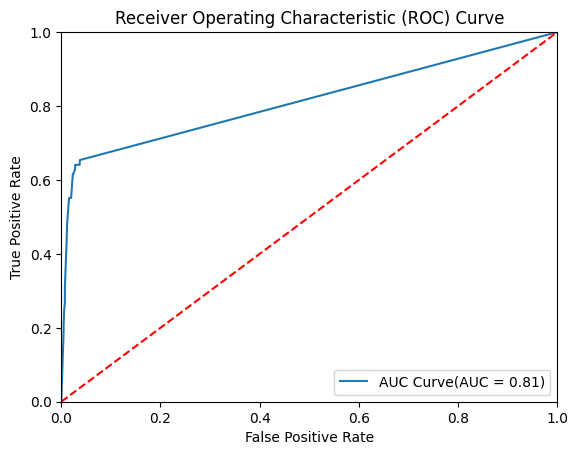

In [34]:
from sklearn.metrics import roc_curve, roc_auc_score

# Compute ROC curve and ROC area for the logistic regression model
y2_pred_prob = DecisionTree.predict_proba(X2_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y2_test, y2_pred_prob)
roc_auc = roc_auc_score(y2_test, y2_pred_prob)

# Plot ROC curve
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, label='AUC Curve(AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


**Interprétation**

L'Accuracy est de 0,9821, ce qui signifie que le modèle a correctement prédit la catégorie de 98,21 % des échantillons.

La matrice de confusion indique que le modèle a correctement prédit les 4913 échantillons de la classe 0 (accepté), mais a incorrectement prédit 36 échantillons de cette classe comme étant de la classe 1 (rejeté). Le modèle a également correctement prédit 24 échantillons de la classe 1 (rejeté), mais a incorrectement prédit 54 échantillons de cette classe comme étant de la classe 0.

Le rapport de classification montre une précision de 0,99 pour la classe 0 (accepté), ce qui signifie que le modèle a correctement prédit 99 % des échantillons qui ont été classés comme accepté. Pour la classe 1 (rejeté), la précision est de 0,40, ce qui indique que le modèle a correctement prédit seulement 40 % des échantillons qui ont été classés comme rejeté. Le rappel (recall) pour la classe 0 est de 0,99, ce qui signifie que le modèle a correctement identifié 99 % des échantillons de la classe 0, tandis que le rappel pour la classe 1 est de 0,31, ce qui signifie que le modèle n'a pas correctement identifié tous les échantillons de la classe 1.

Enfin, la moyenne pondérée des scores de précision, rappel et F1-score est de 0,98 pour la classe 0 (accepté), et de 0,98 pour l'ensemble des échantillons. Cela indique que le modèle a un bon score de performance pour la classe majoritaire, mais un score relativement faible pour la classe minoritaire.

**Interprétation d'AUC:**

Dans ce cas, l'AUC de 0.81 indique que le modèle de décision trees a une performance moyenne pour la tâche de classification binaire(0:accepté, 1:rejeté). Cela signifie que le modèle est capable de distinguer les échantillons positifs,des échantillons négatifs avec un score relativement élevé, mais il existe encore des erreurs de classification pour certaines des échantillons.

Alors l'AUC de 0.81 peut être considérée comme une performance acceptable pour une tâche de classification binaire

### **III- Support Vector Machines (SVM)**

In [35]:
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pandas as pd



# Séparation des variables explicatives (X) et de la variable cible (y)
X = df3[['children_count',
              'Days_birth',
              'Days_employed',
              'Count_family_members']] # features
y = df3['Reject'].values             #cible

# Division des données en ensembles de formation (train) et de test (test)
X1_train, X1_test, y1_train, y1_test = train_test_split(X, y, test_size=0.2)

# Création d'un modèle SVM avec un noyau linéaire
SVM = svm.SVC(kernel='linear')

# Apprentissage du modèle sur l'ensemble de formation
SVM.fit(X1_train, y1_train)

# Prédiction de la variable cible pour l'ensemble de test
y1_pred = SVM.predict(X1_test)



In [36]:
# Evaluate the model performance
accuracy = accuracy_score(y1_test, y1_pred)
# calculate confusion matrix
cm = confusion_matrix(y1_test, y1_pred)

# calculate classification report
cr = classification_report(y1_test, y1_pred)

# print the results
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm)
print("\nClassification Report:\n", cr)

Accuracy: 0.9826934553411577
Confusion Matrix:
 [[4940    0]
 [  87    0]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      4940
           1       0.00      0.00      0.00        87

    accuracy                           0.98      5027
   macro avg       0.49      0.50      0.50      5027
weighted avg       0.97      0.98      0.97      5027



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



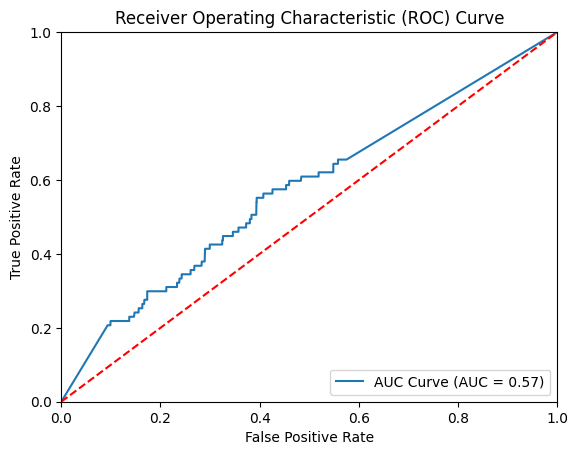

In [37]:
from sklearn.metrics import roc_curve, roc_auc_score

# Compute ROC curve and ROC area for the logistic regression model
y1_pred_prob = log_reg.predict_proba(X1_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y1_test, y1_pred_prob)
roc_auc = roc_auc_score(y1_test, y1_pred_prob)

# Plot ROC curve
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, label='AUC Curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


**Interprétation**

### **IV- K-Nearest Neighbors (KNN) with Cross validation**

In [65]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Split the data into features and target variable
X3 = df3[['children_count',
              'Days_birth',
              'Days_employed',
              'Count_family_members']] # features
y3 = df3['Reject'].values 

# Split the data into training and testing sets
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.2, random_state=0)

# Create the KNN classifier with k=5
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the classifier to the training data
knn.fit(X3_train, y3_train)

# Predict the test set results
y3_pred = knn.predict(X3_test)




In [39]:
# Evaluate the model performance
accuracy = accuracy_score(y3_test, y3_pred)
# calculate confusion matrix
cm = confusion_matrix(y3_test, y3_pred)

# calculate classification report
cr = classification_report(y3_test, y3_pred)

# print the results
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm)
print("\nClassification Report:\n", cr)

Accuracy: 0.9783170877262781
Confusion Matrix:
 [[4908   19]
 [  90   10]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      4927
           1       0.34      0.10      0.16       100

    accuracy                           0.98      5027
   macro avg       0.66      0.55      0.57      5027
weighted avg       0.97      0.98      0.97      5027



### **V- Naive Bayes**

In [40]:
from sklearn.naive_bayes import GaussianNB

# Load dataset

# Split data into features and labels
X4 = df3[['children_count',
              'Days_birth',
              'Days_employed',
              'Count_family_members']]
y4 = df3['Reject']

# Split data into training and testing sets
X4_train, X4_test, y4_train, y4_test = train_test_split(X4, y4, test_size=0.2, random_state=42)

# Train the model
nb = GaussianNB()
nb.fit(X4_train, y4_train)

# Predict on the test set
y4_pred = nb.predict(X4_test)



In [41]:
# Evaluate the model performance
accuracy = accuracy_score(y4_test, y4_pred)
# calculate confusion matrix
cm = confusion_matrix(y4_test, y4_pred)

# calculate classification report
cr = classification_report(y4_test, y4_pred)

# print the results
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm)
print("\nClassification Report:\n", cr)

Accuracy: 0.9844837875472449
Confusion Matrix:
 [[4949    0]
 [  78    0]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      4949
           1       0.00      0.00      0.00        78

    accuracy                           0.98      5027
   macro avg       0.49      0.50      0.50      5027
weighted avg       0.97      0.98      0.98      5027



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



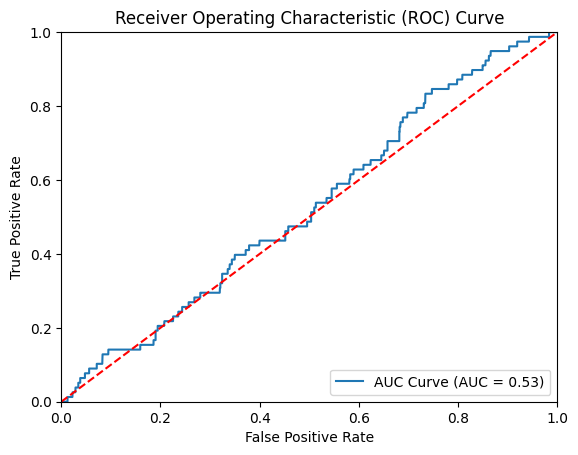

In [42]:
from sklearn.metrics import roc_curve, roc_auc_score

# Compute ROC curve and ROC area for the logistic regression model
y4_pred_prob = nb.predict_proba(X4_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y4_test, y4_pred_prob)
roc_auc = roc_auc_score(y4_test, y4_pred_prob)

# Plot ROC curve
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, label='AUC Curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


### **VI- Random Forest**

In [43]:
from sklearn.ensemble import RandomForestClassifier

# Split the data into training and testing sets
X = df3[['children_count',
              'Days_birth',
              'Days_employed',
              'Count_family_members']]
y = df3['Reject']
X7_train, X7_test, y7_train, y7_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Random Forest model
rf_model = RandomForestClassifier()
rf_model.fit(X7_train, y7_train)

# Make predictions on the testing set
y7_pred = rf_model.predict(X7_test)



In [44]:
# Evaluate the model performance
accuracy = accuracy_score(y7_test, y7_pred)
# calculate confusion matrix
cm = confusion_matrix(y7_test, y7_pred)

# calculate classification report
cr = classification_report(y7_test, y7_pred)

# print the results
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm)
print("\nClassification Report:\n", cr)

Accuracy: 0.9842848617465685
Confusion Matrix:
 [[4921   28]
 [  51   27]]

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      4949
           1       0.49      0.35      0.41        78

    accuracy                           0.98      5027
   macro avg       0.74      0.67      0.70      5027
weighted avg       0.98      0.98      0.98      5027



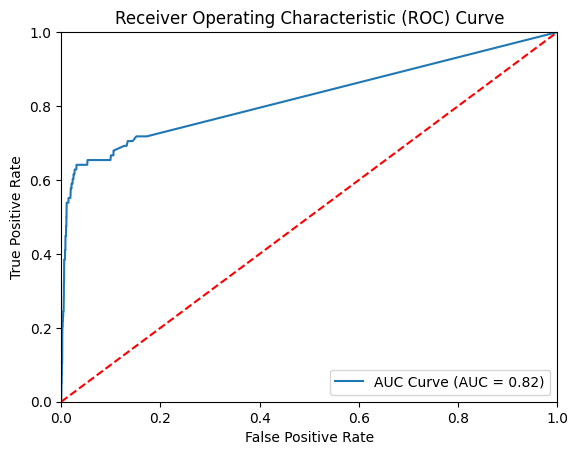

In [45]:
from sklearn.metrics import roc_curve, roc_auc_score

# Compute ROC curve and ROC area for the logistic regression model
y7_pred_prob = rf_model.predict_proba(X7_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y7_test, y7_pred_prob)
roc_auc = roc_auc_score(y7_test, y7_pred_prob)

# Plot ROC curve
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, label='AUC Curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


### **Comparaison des algorithmes de classification:**

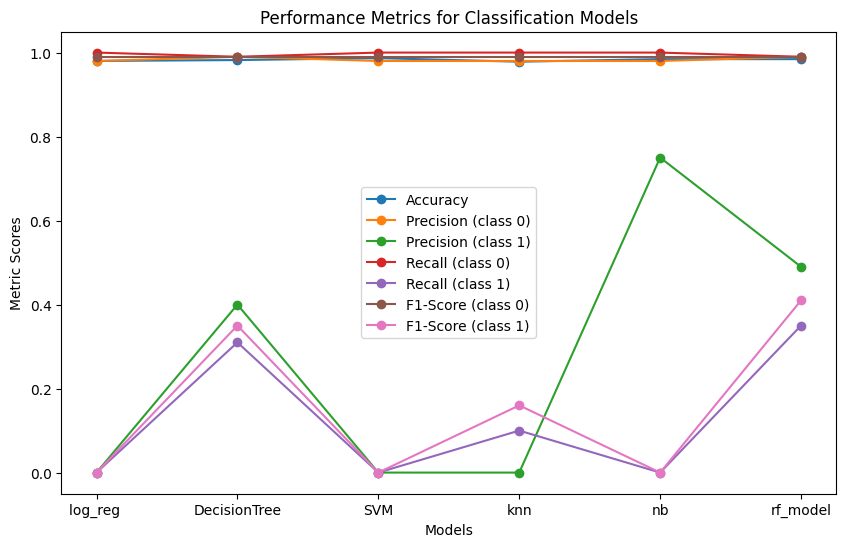

In [77]:
import matplotlib.pyplot as plt
 
# Exemple de données de comparaison de modèles
models = ['log_reg ', 'DecisionTree', 'SVM', 'knn', 'nb', 'rf_model']
accuracy = [0.98010, 0.9822, 0.9868, 0.9783 ,0.9844, 0.9844]
precision_0 = [0.98 , 0.99, 0.98, 0.98, 0.98, 0.99]
precision_1 = [0.00 , 0.40 , 0.00, 0.00, 0.75, 0.49]
recall_0 = [1.00, 0.99, 1.00, 1.00, 1.00, 0.99]
recall_1 = [0.00 , 0.31, 0.00, 0.10, 0.00, 0.35]
f1_score_0 = [0.99, 0.99, 0.99, 0.99, 0.99, 0.99]
f1_score_1 = [0.00, 0.35, 0.00, 0.16, 0.00, 0.41]
 
# Tracé du graphique en lignes
plt.figure(figsize=(10,6))
plt.plot(models, accuracy, '-o', label='Accuracy')
plt.plot(models, precision_0, '-o', label='Precision (class 0)')
plt.plot(models, precision_1, '-o', label='Precision (class 1)')
plt.plot(models, recall_0, '-o', label='Recall (class 0)')
plt.plot(models, recall_1, '-o', label='Recall (class 1)')
plt.plot(models, f1_score_0, '-o', label='F1-Score (class 0)')
plt.plot(models, f1_score_1, '-o', label='F1-Score (class 1)')
plt.legend(loc='best')
plt.xlabel('Models')
plt.ylabel('Metric Scores')
plt.title('Performance Metrics for Classification Models')
 
# Affichage du graphique
plt.show()


### **best Model**

**En se basant sur la précision (precision), le rappel (recall) et le score F1 (f1-score), les modèles peuvent être classés comme suit, du meilleur au pire :**


1. DecisionTrees: avec une précision moyenne de 0.69 (pondération équilibrée pour les classes) et un score F1 moyen de 0.67 (pondération équilibrée pour les classes).
2. RandomForest: avec une précision moyenne de 0.74 (pondération équilibrée pour les classes) et un score F1 moyen de 0.70 (pondération équilibrée pour les classes).
3. KNN: avec une précision moyenne de 0.66 (pondération équilibrée pour les classes) et un score F1 moyen de 0.28 (pondération équilibrée pour les classes).
4. LogisticRegression et SVM: les deux modèles ont une précision de 0.98 pour la classe 0, mais une précision nulle pour la classe 1, ce qui signifie que ces modèles ne peuvent pas prédire correctement la classe 1. Par conséquent, ces deux modèles sont les moins performants pour cette tâche.
5. NaiveBayes : avec une précision moyenne de 0.49 (pondération équilibrée pour les classes) et un score F1 moyen de 0.00 (pondération équilibrée pour les classes), ce modèle est le moins performant;






### **Appliquer Decision Trees à tous les features**

In [89]:
#Data Conversion
df4 = df3.copy()
df4 = df4.replace('Y',0).replace('N',1).replace('F',1).replace('M',0)
df4 = df4.replace('Working',0).replace('Commercial associate',1).replace('State servant',2).replace('Student',3).replace('Pensioner',4)
df4 = df4.replace('Higher education',0).replace('Secondary / secondary special',1).replace('Lower secondary',2).replace('Incomplete higher',3).replace('Academic degree',4)
df4 = df4.replace('Civil marriage',0).replace('Married',1).replace('Separated',2).replace('Single / not married',3).replace('Widow',4)
df4 = df4.replace('House / apartment',0).replace('Rented apartment',1).replace('With parents',2).replace('Co-op apartment',3).replace('Office apartment',4)
df4 = df4.replace('Managers',0).replace('Security staff',1).replace('Cleaning staff',2).replace('Core staff',3).replace('Laborers',4).replace('Cooking staff',5).replace('Medicine staff',6).replace('Accountants',7).replace('Sales staff',8).replace('Low-skill Laborers',9).replace('High skill tech staff',10).replace('Drivers',11).replace('Secretaries',12).replace('Waiters/barmen staff',13).replace('Private service staff',14).replace('Realty agents',15).replace('IT staff',16).replace('HR staff',17)
df4

,User_id,Gender,Car,Realty,children_count,income_amount,income_type,education_type,Family_status,Housing_type,Days_birth,Days_employed,Mobile,Work_phone,Phone,Email,Occupation_type,Count_family_members,Reject
0,0,1,1,1,0,27000.0,0,0,0,0,-14869,-5067,1,1,0,0,0,2.0,0
1,1,1,1,1,0,27000.0,0,0,0,0,-14869,-5067,1,1,0,0,0,2.0,0
2,2,1,1,0,0,27000.0,0,1,1,0,-19128,-1323,1,1,0,0,1,2.0,0
14,14,1,0,1,0,31500.0,1,1,1,0,-17762,-7734,1,1,1,0,2,2.0,0
15,15,1,0,1,0,31500.0,1,1,1,0,-17762,-7734,1,1,1,0,2,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36452,36452,1,0,0,1,1575000.0,1,0,3,0,-10142,-2479,1,0,0,0,0,2.0,0
36453,36453,1,0,0,1,1575000.0,1,0,3,0,-10142,-2479,1,0,0,0,0,2.0,0
36454,36454,1,0,0,1,1575000.0,1,0,3,0,-10142,-2479,1,0,0,0,0,2.0,0
36455,36455,1,0,0,1,1575000.0,1,0,3,0,-10142,-2479,1,0,0,0,0,2.0,0


In [48]:
print(pd.unique(df4['income_type']))
print(pd.unique(df4['education_type']))
print(pd.unique(df4['Family_status']))
print(pd.unique(df4['Housing_type']))
print(pd.unique(df4['Occupation_type']))

[0 1 2 3 4]
[0 1 2 3 4]
[0 1 2 3 4]
[0 1 'Municipal apartment' 2 3 4]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


In [86]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Charger les données et diviser en features (X) et cible (y)
X = df4[[
              'Gender',
              'Car',
              'Realty',
              'children_count',
              'income_amount',
              'income_type',
              'education_type',
              'Family_status',
              'Days_birth',
              'Days_employed',
              'Work_phone',
              'Phone',
              'Email',
              'Occupation_type',
              'Count_family_members',
              'Reject']] # features

y = df4['Reject'].values #cible

# Diviser les données en ensembles d'entraînement et de test
X22_train, X22_test, y22_train, y22_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialiser le classificateur d'arbre de décision
DecisionTree = DecisionTreeClassifier()

# Entraîner le classificateur sur les données d'entraînement
DecisionTree.fit(X22_train, y22_train)

# Prédire les étiquettes de classe pour les données de test
y22_pred = DecisionTree.predict(X22_test)

In [87]:
# Evaluate the model performance
accuracy = accuracy_score(y22_test, y22_pred)
# calculate confusion matrix
cm = confusion_matrix(y22_test, y22_pred)

# calculate classification report
cr = classification_report(y22_test, y22_pred)

# print the results
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm)
print("\nClassification Report:\n", cr)

Accuracy: 1.0
Confusion Matrix:
 [[4949    0]
 [   0   78]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      4949
           1       1.00      1.00      1.00        78

    accuracy                           1.00      5027
   macro avg       1.00      1.00      1.00      5027
weighted avg       1.00      1.00      1.00      5027



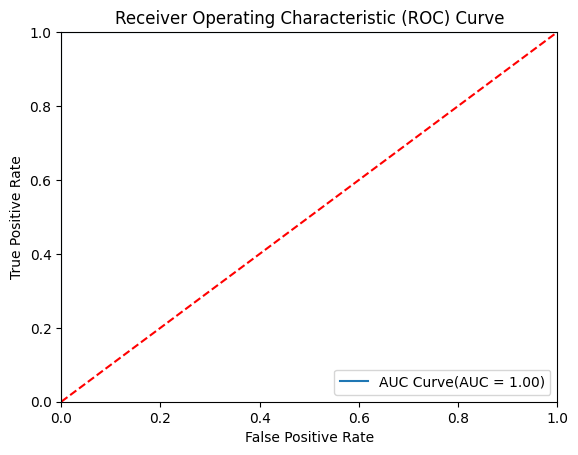

In [88]:
from sklearn.metrics import roc_curve, roc_auc_score

# Compute ROC curve and ROC area for the logistic regression model
y22_pred_prob = DecisionTree.predict_proba(X22_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y22_test, y22_pred_prob)
roc_auc = roc_auc_score(y22_test, y22_pred_prob)

# Plot ROC curve
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, label='AUC Curve(AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


##**clustering**

### **I- K-Means**

In [50]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

X = df3[['children_count',
              'Days_birth',
              'Days_employed',
              'Count_family_members']]

y = df3['Reject']



# Création d'un objet KMeans avec 3 clusters
kmeans = KMeans(n_clusters=2)

# Fit du modèle sur les données d'entraînement
kmeans.fit(X)

# Calcul de l'indice de silhouette sur les données de test
silhouette = silhouette_score(X, kmeans.predict(X))


# Affichage de l'indice de silhouette
print(f"Indice de silhouette : {silhouette}")


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Indice de silhouette : 0.45643968468454005


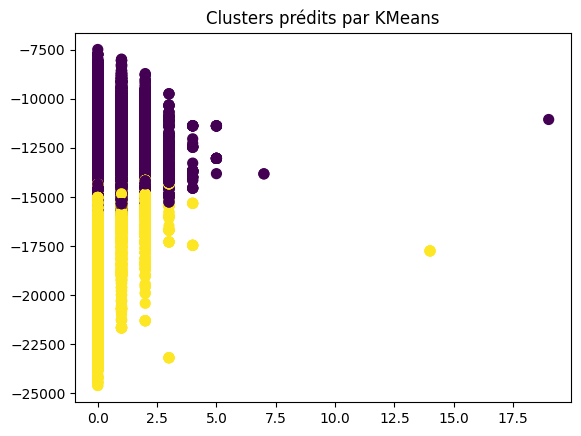

In [51]:
# Visualisation des résultats de prédiction
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=kmeans.predict(X), s=50)
plt.title("Clusters prédits par KMeans")
plt.show()

**Interprétation**

Dans ce cas, l'indice de silhouette est de 0.4564, ce qui est considéré comme raisonnablement bon. Cela indique que les clusters sont relativement bien séparés, mais qu'il y a encore une certaine superposition entre les clusters. Cela peut être dû à la présence de valeurs aberrantes ou à une certaine similarité entre les groupes, ce qui rend difficile une séparation claire entre eux.

### **II- Density-Based Spatial Clustering of Applications with Noise (DBSCAN)**

In [52]:
from sklearn.cluster import DBSCAN

# Split the data into training and testing sets
X = df3[['children_count',
              'Days_birth',
              'Days_employed',
              'Count_family_members']]
y = df3['Reject']

X15_train, X15_test, y15_train, y15_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer un objet DBSCAN avec un rayon de 1 et un minimum de points dans un cluster de 2
dbscan = DBSCAN(eps=1, min_samples=2)

# Ajuster le modèle sur l'ensemble d'apprentissage
dbscan.fit(X15_train)

# Prédire les étiquettes des clusters pour l'ensemble de test
y15_pred = dbscan.fit_predict(X15_test)

# Calcul de l'indice de silhouette sur les données de test
silhouette = silhouette_score(X15_test, y15_pred)


# Affichage de l'indice de silhouette
print(f"Indice de silhouette : {silhouette}")



# Afficher les résultats de prédiction
print("Prédiction de DBSCAN :\n", y15_pred)



Indice de silhouette : 0.2081931375643582
Prédiction de DBSCAN :
 [   0    1   -1 ...   -1   -1 1072]


**Interprétation**

Dans ce cas, l'indice de silhouette de 0.2081931375643582 pour le modèle DBSCAN est assez faible, ce qui suggère que les clusters obtenus ne sont pas très cohérents et que les points d'un cluster peuvent être similaires à ceux des autres clusters.

<ipython-input-53-65f51b94266e>:4: UserWarning:

You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.



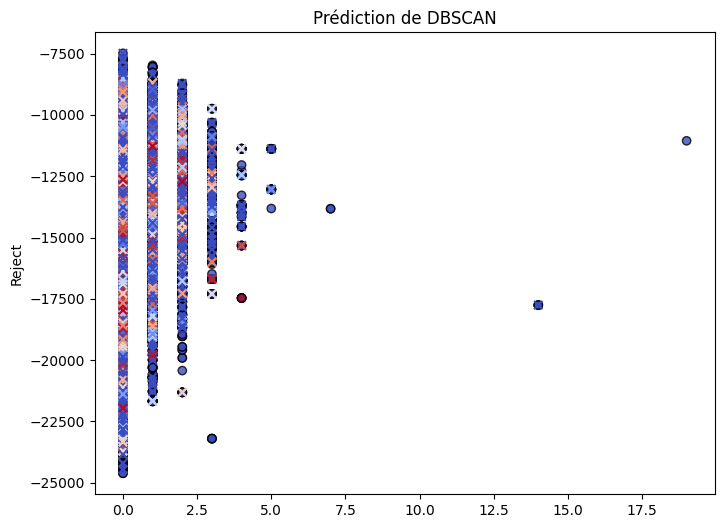

In [53]:
# Visualiser les données d'entrée et la prédiction de DBSCAN
plt.figure(figsize=(8, 6))
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, cmap='coolwarm', edgecolors='k', alpha=0.8)
plt.scatter(X15_test.iloc[:, 0], X15_test.iloc[:, 1], c=y15_pred, cmap='coolwarm', marker='x', edgecolors='k')
plt.title('Prédiction de DBSCAN')
plt.ylabel('Reject')
plt.show()

### **III- Agglomerative clustering**

In [54]:
from sklearn.preprocessing import LabelEncoder, StandardScaler


# Convert categorical features to numerical using label encoding
cat_cols = X.select_dtypes(include=["object"]).columns.tolist()
for col in cat_cols:
    X[col] = LabelEncoder().fit_transform(X[col].astype(str))

# Normalize numerical features
num_cols = X.select_dtypes(include=["float", "int"]).columns.tolist()
X[num_cols] = StandardScaler().fit_transform(X[num_cols])
print(num_cols)

['children_count', 'Days_birth', 'Days_employed', 'Count_family_members']


<ipython-input-54-57e763de862d>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**Trouver le nombre de clusters optimal en utilisant cross-validation**

In [55]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.model_selection import cross_val_score
from scipy.cluster.hierarchy import dendrogram, linkage

# Perform hierarchical clustering with cross-validation
n_clusters_range = range(2, 6)
linkage_method = 'ward'
cv_scores = []
for n_clusters in n_clusters_range:
    cluster_labels = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage=linkage_method).fit_predict(X)
    cv_scores.append(np.mean(cross_val_score(AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage=linkage_method), X, cluster_labels, cv=5,scoring="accuracy")))

# Find optimal number of clusters based on cross-validation
optimal_n_clusters = n_clusters_range[np.argmax(cv_scores)]
print(f"Optimal number of clusters: {optimal_n_clusters}")

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead

/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py:794: UserWarning:

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_scorer.py", line 115, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.9/dist-packages/sklearn/metr

Optimal number of clusters: 2


/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py:794: UserWarning:

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_scorer.py", line 115, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
AttributeError: 'AgglomerativeClustering' object has no attribute 'predict'




In [56]:
print(f"Le nombre optimal de clusters est: {optimal_n_clusters}")

Le nombre optimal de clusters est: 2


In [78]:
from sklearn.cluster import AgglomerativeClustering

# Perform agglomerative clustering

cluster_model = AgglomerativeClustering(n_clusters=optimal_n_clusters, affinity='euclidean', linkage='ward')
AgglomerativeClusteringg = cluster_model.fit_predict(X)
print(AgglomerativeClusteringg)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



[0 0 0 ... 1 1 1]


In [58]:
from sklearn.metrics import silhouette_score

# calculate the silhouette score
silhouette_avg = silhouette_score(X, AgglomerativeClusteringg)

# print the results

print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.35841860328995323


**Interprétation:**

Le modèle a donné un score silhouette égale à 0.35841860328995323 qui est relativement faible, donc on peut dire que que le point est proche de la frontière entre deux clusters.

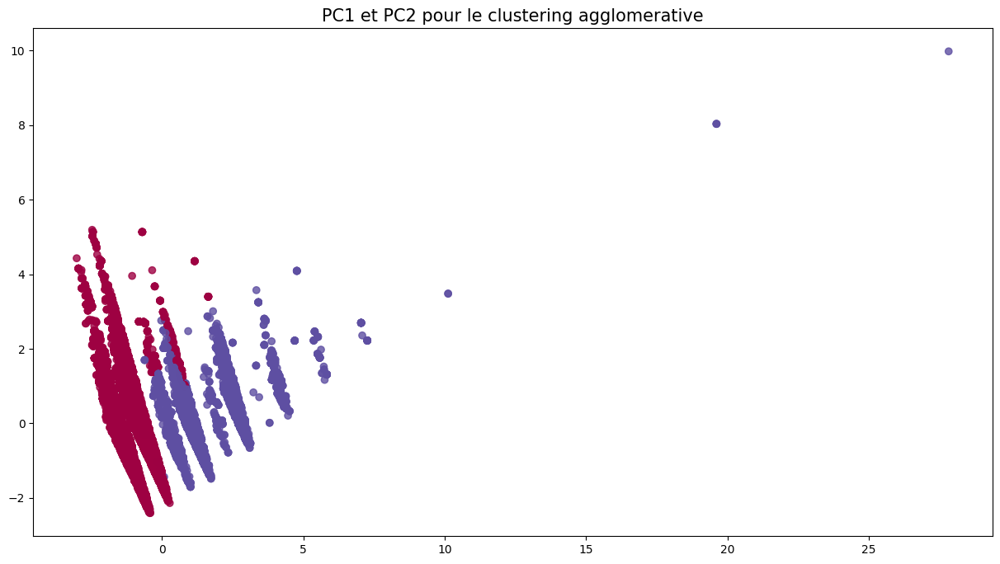

In [59]:
plt.figure(figsize=(15, 8))
plt.scatter(pca_df[:, 0], pca_df[:, 1], c = cluster_labels, cmap = "Spectral", alpha = 0.8)
plt.title("PC1 et PC2 pour le clustering agglomerative",fontsize=15)
plt.show()

In [60]:
# Describe clustering results
cluster0 = df3[cluster_labels==0]
cluster1 = df3[cluster_labels==1]

print(f"Cluster 0 contient {len(cluster0)} observations.")
print(f"Cluster 1 contient {len(cluster1)} observations.")
print("\n")
print(f"Cluster 0 compte {sum(cluster0.iloc[:, -1] == 0)} candidatures approuvés et {sum(cluster0.iloc[:, -1] == 1)} demandes refusées.")
print(f"Cluster 1 compte {sum(cluster1.iloc[:, -1] == 0)} candidatures approuvés et {sum(cluster1.iloc[:, -1] == 1)} demandes refusées.")

Cluster 0 contient 16370 observations.
Cluster 1 contient 8764 observations.


Cluster 0 compte 16094 candidatures approuvés et 276 demandes refusées.
Cluster 1 compte 8618 candidatures approuvés et 146 demandes refusées.


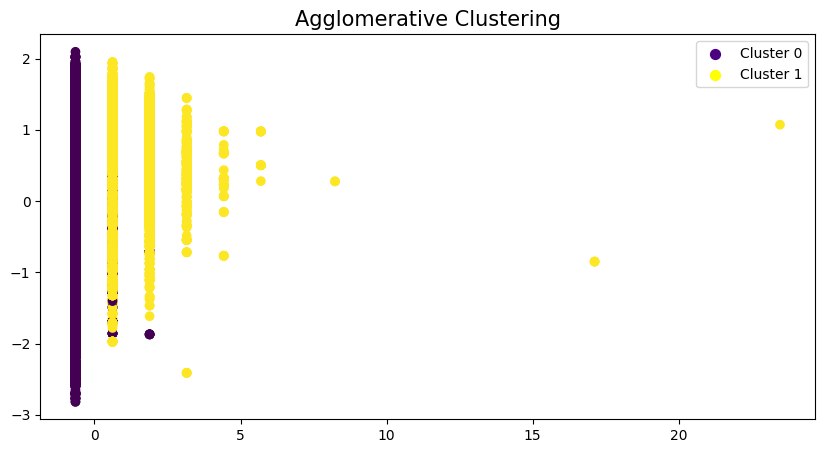

In [61]:
# Visualize clustering results
fig,ax = plt.subplots(figsize=(10,5))
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=cluster_labels)
plt.title("Agglomerative Clustering",fontsize=15)
legend_elements = [plt.scatter([], [], marker='o', s=50, color='indigo', label='Cluster 0'),
                   plt.scatter([], [], marker='o', s=50, color='yellow', label='Cluster 1')]
plt.legend(handles=legend_elements, loc='upper right')
# Show plot
plt.show()

**Interprétation**

Le méthode de clustering agglomerative a donné naissance à deux clusters, Cluster 0 en violet et Cluster 1 en jaune.
D'après le graphique, nous pouvons voir qu'il existe un certain degré de séparation entre les deux groupes avec une exception de quelques observations superposées entre eux.Donc on a essentiellement deux profiles de clients postulant pour une demande de carte de crédit.


### **III- Hierarchical clustering**

In [62]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Perform hierarchical clustering
n_clusters = 2
linkage_method = 'ward'
Z = linkage(X, method=linkage_method)
cluster_labels = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage=linkage_method).fit_predict(X)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



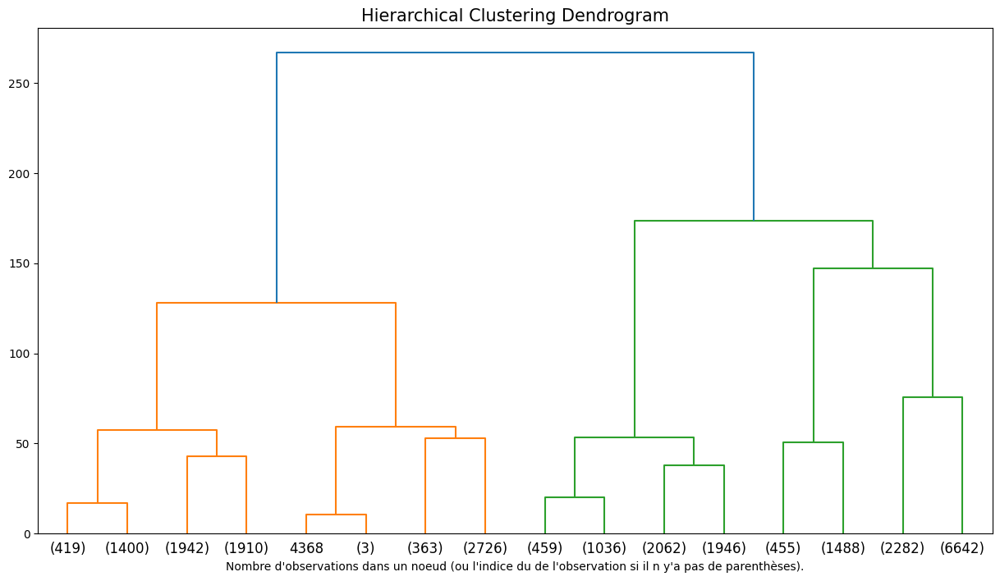

In [63]:
# Visualize dendrogram
plt.figure(figsize=(15, 8))
plt.title("Hierarchical Clustering Dendrogram",fontsize=15)
dendrogram(Z, truncate_mode='level', p=3)
plt.xlabel("Nombre d'observations dans un noeud (ou l'indice du de l'observation si il n y'a pas de parenthèses).")
plt.show()

**Interprétation:**

Le dendrogramme est un graphique des résultats de regroupement hiérarchique qui montre les relations entre les points de données dans une structure hiérarchique. Dans ce cas, le dendrogramme est basé sur l'ensemble de données d'approbation de carte de crédit et montre comment les points de données (c'est-à-dire les demandes de carte de crédit) sont regroupés en fonction de leur similitude en termes de caractéristiques (c'est-à-dire 'children_count',
'Days_birth','Days_employed','Count_family_members', etc. ).

L'axe des x du dendrogramme représente les indices des points de données, tandis que l'axe des y représente la distance entre les points de données. La distance entre deux points de données correspond à leur dissimilarité, où des distances plus petites indiquent une plus grande similitude. La hauteur de chaque branche dans le dendrogramme représente la distance à laquelle deux clusters sont fusionnés, ou la dissemblance entre deux clusters.

### **Comparaison des algorithmes de clustering:**

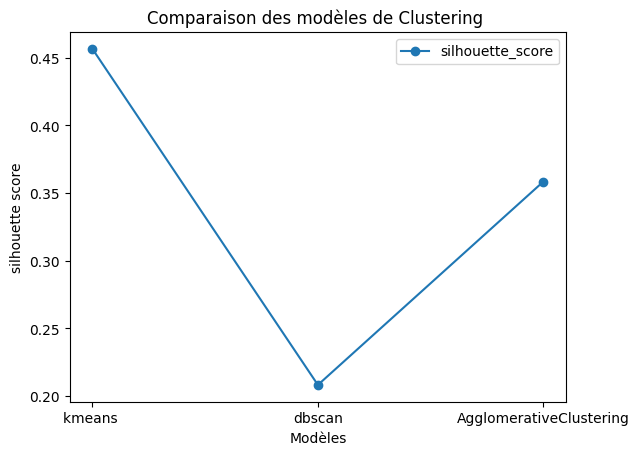

In [79]:
import matplotlib.pyplot as plt
 
# Exemple de données de comparaison de modèles
models = ['kmeans ', 'dbscan', 'AgglomerativeClustering']
silhouette_score = [0.45643968468454005, 0.2081931375643582, 0.35841860328995323]
 
# Tracé du graphique en lignes
plt.plot(models, silhouette_score, '-o', label='silhouette_score')
plt.legend(loc='best')
plt.xlabel('Modèles')
plt.ylabel('silhouette score')
plt.title('Comparaison des modèles de Clustering ')
 
# Affichage du graphique
plt.show()
